<h1 align="center">Volume 2: The Fourier Transform.</h1>

    <Sam Layton>
    <Section 003>
    <11/30/22>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
import numpy as np
from scipy.io import wavfile
import IPython.display as ipd
from scipy import fftpack
from scipy import signal
import imageio
import time

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        # store the sample rate and samples
        self.rate = rate
        self.samples = np.array(samples)


    # Problems 1.1 and 1.7
    def plot(self, DFT = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        # get number of samples, calculate time interval, and create time array
        n = len(self.samples)
        seconds = n / self.rate
        time = np.linspace(0, seconds, n)

        # If DFT is true, set the figure size and subplot size appropriately
        if DFT == True:
            plt.figure(figsize = (6,6))
            plt.subplot(2,1,1)
        
        # Set the figure size if DFT is false
        else:
            plt.figure(figsize = (6,3))
        
        # Plot the time versus amplitude graph
        plt.plot(time, self.samples)
        plt.title("Amplitude of Sound Wave")
        
        # label the axes, limit the y-axis, and make it a nice layout
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.ylim([-32768, 32767])
        plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))

        # if DFT is True, plot the DFT of the samples and adjust for hertz scale
        if DFT == True:
            dft = np.abs(fftpack.fft(self.samples))
            hertz = np.linspace(0, self.rate / 2, n//2)

            # plot the DFT of the samples in the right subplot and give it a title
            plt.subplot(2,1,2)
            plt.plot(hertz, dft[:len(dft)//2])
            plt.title("DFT of Sound Wave")

            # label the axes, limit the y-axis
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
            
        
        # Make it neat and show the plot
        plt.tight_layout()
        plt.show()


    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        # check if the samples are of type np.int16 and scale them if not or if force is True
        if type(self.samples[0]) != np.int16 or force:
            self.samples = (self.samples / np.max(np.abs(self.samples)) * 32767).astype(np.int16)

        # export the samples to a wav file
        wavfile.write(filename, self.rate, self.samples)

    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        # check if the two sample arrays are the same length, raise an error if not
        if len(self.samples) != len(other.samples):
            raise ValueError("The two soundfiles are not the same length.")

        # add the samples from the two SoundWave objects and return a new SoundWave object
        else:
            return SoundWave(self.rate, self.samples + other.samples)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Raise a value error if self and other have different sample rates
        if self.rate != other.rate:
            raise ValueError("The two soundfiles have different sample rates.")
        
        # Concatenate the samples from the two SoundWave objects and return a new SoundWave object
        else:
            return SoundWave(self.rate, np.concatenate((self.samples, other.samples)))
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Raise a value error if self and other have different sample rates
        if self.rate != other.rate:
            raise ValueError("The two soundfiles have different sample rates.")

        # Pad the shorter sample array with zeros to make it the same length as the longer array
        if len(self.samples) > len(other.samples):
            other.samples = np.pad(other.samples, (0, len(self.samples) - len(other.samples)), 'constant')
        else:
            self.samples = np.pad(self.samples, (0, len(other.samples) - len(self.samples)), 'constant')

        # Take the fft of the samples from the two SoundWave objects and do the hadamard product
        self_fft = fftpack.fft(self.samples)
        other_fft = fftpack.fft(other.samples)
        product = fftpack.ifft(self_fft * other_fft).real

        # return a new SoundWave object with the convolved samples
        return SoundWave(self.rate, product)


    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Raise a value error if self and other have different sample rates
        if self.rate != other.rate:
            raise ValueError("The two soundfiles have different sample rates.")
        
        # Pad each sample array with zeros to make them a power of 2 length greater than the sum of their lengths
        length = len(self.samples) + len(other.samples) - 1
        power = 1

        # Loop through and increase power until it's greater than length variable
        while 2**power < length:
            power += 1

        # Pad the two arrays so they are a power of 2 length greater than the sum of their lengths
        self.samples = np.pad(self.samples, (0, 2**power - len(self.samples)), 'constant')
        other.samples = np.pad(other.samples, (0, 2**power - len(other.samples)), 'constant')

        # Take the fft of the samples from the two SoundWave objects and do the hadamard product
        self_fft = fftpack.fft(self.samples)
        other_fft = fftpack.fft(other.samples)
        product = fftpack.ifft(self_fft * other_fft).real

        # return a new SoundWave object with the convolved samples
        return SoundWave(self.rate, product[:length])


    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        # get the indices of the frequencies between low_freq and high_freq
        low_index = int((low_freq * len(self.samples)) / self.rate)
        high_index = int((high_freq * len(self.samples)) / self.rate)


        # Take the fft of the samples and set the frequencies between low_freq and high_freq to 0
        fft = fftpack.fft(self.samples)
        fft[low_index:high_index] = 0

        # Also set the n - kth frequency to 0 for k between low_freq and high_freq
        fft[-high_index:-low_index] = 0

        # Take the inverse fft of the samples and set the samples to the real part of the result
        self.samples = fftpack.ifft(fft)

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

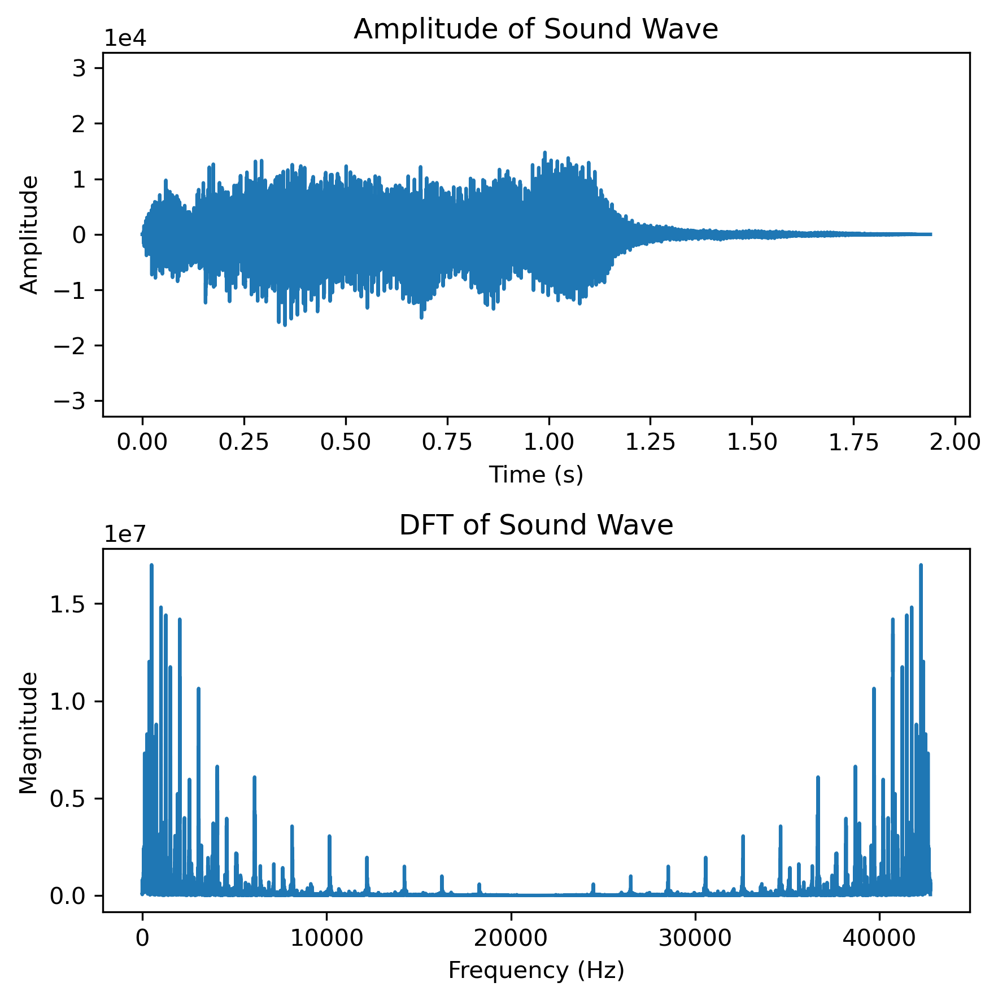

In [4]:
# Get the sample rate and samples from the wav file and create a SoundWave object.
rate, samples, = wavfile.read("tada.wav")
tada = SoundWave(rate, samples)

# Plot the sound wave.
tada.plot(True)

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [130]:
# Export the sound wave to a wav file both with and without scaling.
tada.export("tada2.wav")
tada.export("tada3.wav", force=True)

# Play the sound waves of second wav file.
ipd.Audio(filename="tada2.wav")



In [131]:
# Play the sound waves of third wav file.
ipd.Audio(filename="tada3.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [132]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    # Give the sample rate and calculate the number of samples and time array.
    rate = 44100
    n = int(rate * duration)
    time = np.linspace(0, duration, n)

    # Generate the samples
    samples = np.sin(2 * np.pi * frequency * time)

    # Return the SoundWave object.
    return SoundWave(rate, samples)

In [133]:
# Generate a sound wave with a frequency of 440 Hz and a duration of 2 seconds.
a_note = generate_note(440, 2)
ipd.Audio(data = a_note.samples, rate=a_note.rate)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [134]:
# Generate an A, C, and E note of duration 3 seconds.
a_note = generate_note(440, 3)
c_note = generate_note(523.25, 3)
e_note = generate_note(659.25, 3)

# Combine the three notes into a chord using the + operator.
chord =  a_note + c_note + e_note

# Play the chord.
ipd.Audio(data = chord.samples, rate=chord.rate)


In [135]:
#Making a custom tune with an A minor chord

# Genarate base notes for a chord
b1 = generate_note(220, 3)
b2 = generate_note(110, 3)
b3 = generate_note(659.25/2, 3)

# Form the basic chord
bchord = b1 + b2 + b3

# Generate an A note, a C note, and an E note of duration 1 second.
a_note = generate_note(440, 1)
c_note = generate_note(523.25, 1)
e_note = generate_note(659.25, 1)

# Concatenate the three notes into a chord using the >> operator.
sound = a_note >> c_note >> e_note

# Add the chord to the sound
sound = sound + bchord

# Play the sound
ipd.Audio(data = sound.samples, rate=sound.rate)

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [136]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    # Get the length of the array.
    n = len(samples)

    # Make a matrix using broadcasting.
    m = np.arange(n).reshape((n, 1))
    M = m @ m.T

    # Compute the DFT Matrix.
    W = np.exp((-2j * np.pi/n) * M)
    
    # compute the DFT, scale it, and return it
    transform = (W@samples) / n
    return transform

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [137]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    # Get the length of the array.
    size = len(samples)

    def split(samples):
        """Split the array into two halves."""
        # Get the length of the array.
        n = len(samples)

        # Test if it is less than the threshold, compute the simple DFT if so.
        if n <= threshold:
            return n * simple_dft(samples)

        # Split the array into two halves and recurse through the odd and even halves.
        else:
            even = split(samples[::2])
            odd = split(samples[1::2])
            z = np.zeros(n, dtype=complex)

            # Calculate the exopnential term of the sum.
            for k in range(n):
                z[k] = np.exp((-2j * np.pi * k) / n)
                m = n // 2

            # Concatenate two arrays of length m and return the result.
            return np.concatenate([even + z[:m] * odd, even + z[m:] * odd])
    
    # Return the result of the split function.
    return split(samples) / size
            

    

In [138]:
# Generate a random array and time the DFT, FFT, and scipy FFT algorithms.
a = np.random.random(2**13)
%time simple_dft(a)
%time simple_fft(a)
%time fftpack.fft(a)

# Check if the results are the same.
np.allclose(len(a) * simple_fft(a), fftpack.fft(a))


CPU times: user 1.95 s, sys: 1.82 s, total: 3.77 s
Wall time: 3.65 s
CPU times: user 505 ms, sys: 237 ms, total: 742 ms
Wall time: 276 ms
CPU times: user 344 µs, sys: 384 µs, total: 728 µs
Wall time: 696 µs


True

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

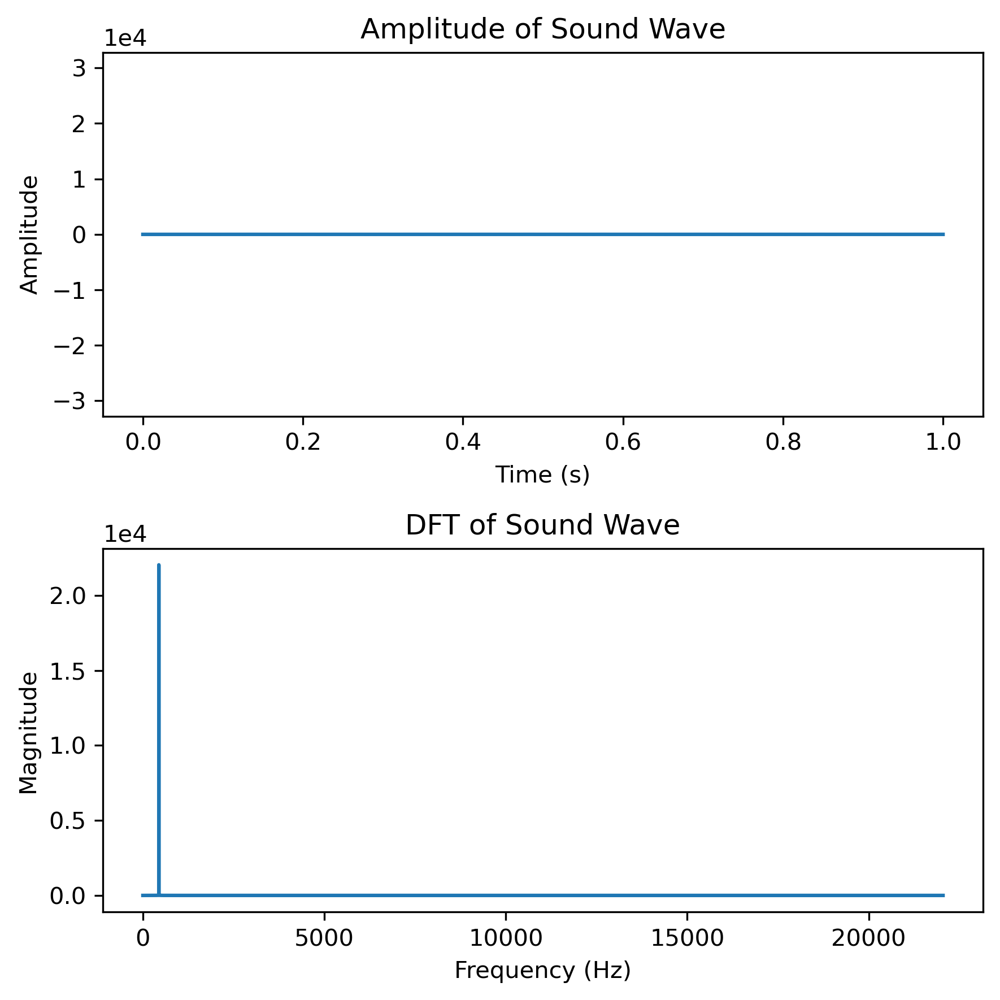

In [139]:
# Plot the DFT of the a_note sound wave.
a_note.plot(True)

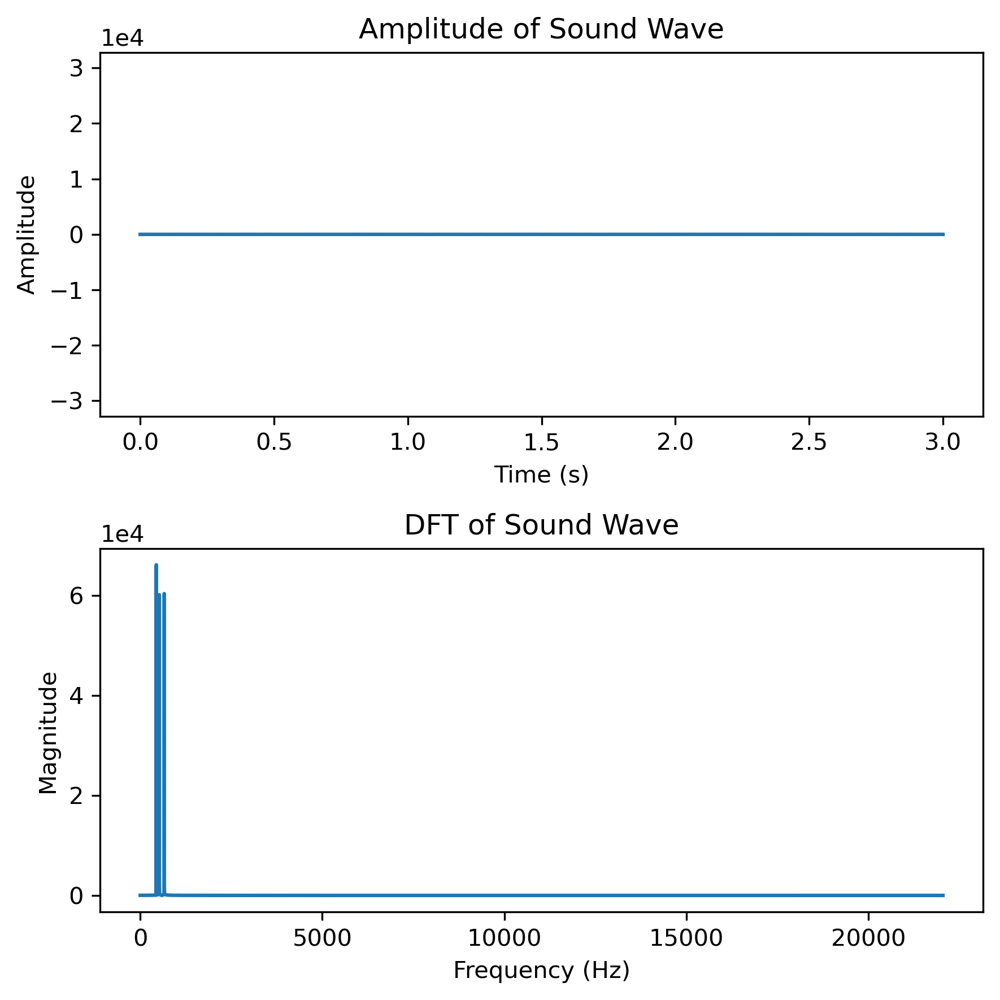

In [140]:
# plot the DFT of the chord sound wave.
chord.plot(True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [141]:
# Get the sample rate and samples from the wav file and create a SoundWave object.
rate, samples, = wavfile.read("mystery_chord.wav")
sound = SoundWave(rate, samples)
coefficients = np.abs(fftpack.fft(samples))

# Take the argsort of the coefficients and get the indices of the largest 4 coefficients.
kval = (np.argsort(coefficients[:len(coefficients)//2])[::-1])[:4]

# convert the indices to frequencies.
frequencies = [rate * k / len(samples) for k in kval]

# Print the frequencies.
print("Thus we have an A at %d hz, G at %d hz, C at %d hz, and a D at %d hz." % tuple(frequencies))


Thus we have an A at 440 hz, G at 784 hz, C at 523 hz, and a D at 587 hz.


The notes are...

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [142]:
# Generate a random array of white noise
rate = 22050        
whitesamples = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)

# Create a SoundWave object from the samples.
white_noise = SoundWave(rate, whitesamples)

# Read the wav file and create a SoundWave object.
rate, samples, = wavfile.read("tada.wav")
tada = SoundWave(rate, samples)

# Convolute the two sound waves together and concatenate the result.
new = white_noise * tada
new = new >> new

# Play the result.
ipd.Audio(data = new.samples, rate=tada.rate)


### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [143]:
# Read the GCG wav files and create SoundWave objects.
rate, GCGsamples, = wavfile.read("GCG.wav")
GCG = SoundWave(rate, GCGsamples)

# Read the CGC wav files and create SoundWave objects.
rate, CGCsamples, = wavfile.read("CGC.wav")
CGC = SoundWave(rate, CGCsamples)

# Convolute the two sound waves together and time it.
start = time.time()
new = GCG ** CGC
end = time.time()
powmethod = end - start

# convolve the two sound waves together and time it using scipy.signal.convolve.
start = time.time()
scipyConvolve = signal.fftconvolve(GCG.samples, CGC.samples)
end = time.time()
scipytime = end - start

# Print the time it took and give the audio
print("The time it took to convolute the two sound waves using ** was %f seconds." % powmethod)
print("The time it took to convolute the two sound waves using scipy.signal.convolve was %f seconds." % scipytime)
ipd.Audio(data = new.samples, rate= new.rate)

The time it took to convolute the two sound waves using ** was 0.204883 seconds.
The time it took to convolute the two sound waves using scipy.signal.convolve was 0.067575 seconds.


In [144]:
# use the scipy.signal.fftconvolve function to convolute the two sound waves and play the result.
new = signal.fftconvolve(GCGsamples, CGCsamples)
ipd.Audio(data = new, rate=rate)

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [145]:
# read the two wav files and create SoundWave objects.
rate, chopinsamples, = wavfile.read("chopin.wav")
rate, balloonsamples, = wavfile.read("balloon.wav")
chopin = SoundWave(rate, chopinsamples)
balloon = SoundWave(rate, balloonsamples)

# convolute the two sound waves together and play the result.
new = signal.fftconvolve(chopinsamples, balloonsamples)
ipd.Audio(data = new, rate=rate)

In [146]:
# play the chopin sound wave.
ipd.Audio(data = chopinsamples, rate=rate)

In [147]:
# play the balloon sound wave.
ipd.Audio(data = balloonsamples, rate=rate)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [148]:
# Get noisy1 and noisy2 from the wav files and create SoundWave objects.
rate, samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate, samples)
rate, samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate, samples)

# play the noisy1 sound wave.
ipd.Audio(data = noisy1.samples, rate=noisy1.rate)

In [149]:
# clean the noisy1 sound wave and play the result.
noisy1.clean(1250,2600)
ipd.Audio(data = noisy1.samples, rate=noisy1.rate)

/Users/samlayton/opt/anaconda3/lib/python3.9/site-packages/IPython/lib/display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [150]:
# play the noisy2 sound wave.
ipd.Audio(data = noisy2.samples, rate=noisy2.rate)

In [151]:
# clean the noisy2 sound wave and play the result.
noisy2.clean(1300,10000)
ipd.Audio(data = noisy2.samples, rate=noisy2.rate)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [6]:
# read the vuvuzela wavefile and sample the stereo 
rate, stereo =wavfile.read("vuvuzela.wav")
sample1 = stereo[:,0]
sample2 = stereo[:,1]

# create SoundWave objects from the samples and play the left channel.
vuvuzela1 = SoundWave(rate,sample1)
vuvuzela2 = SoundWave(rate,sample2)
ipd.Audio(data = vuvuzela1.samples, rate=vuvuzela1.rate)

In [153]:
# play the vuvuzela sound wave of the right channel.
ipd.Audio(data = vuvuzela2.samples, rate=vuvuzela2.rate)

/Users/samlayton/opt/anaconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


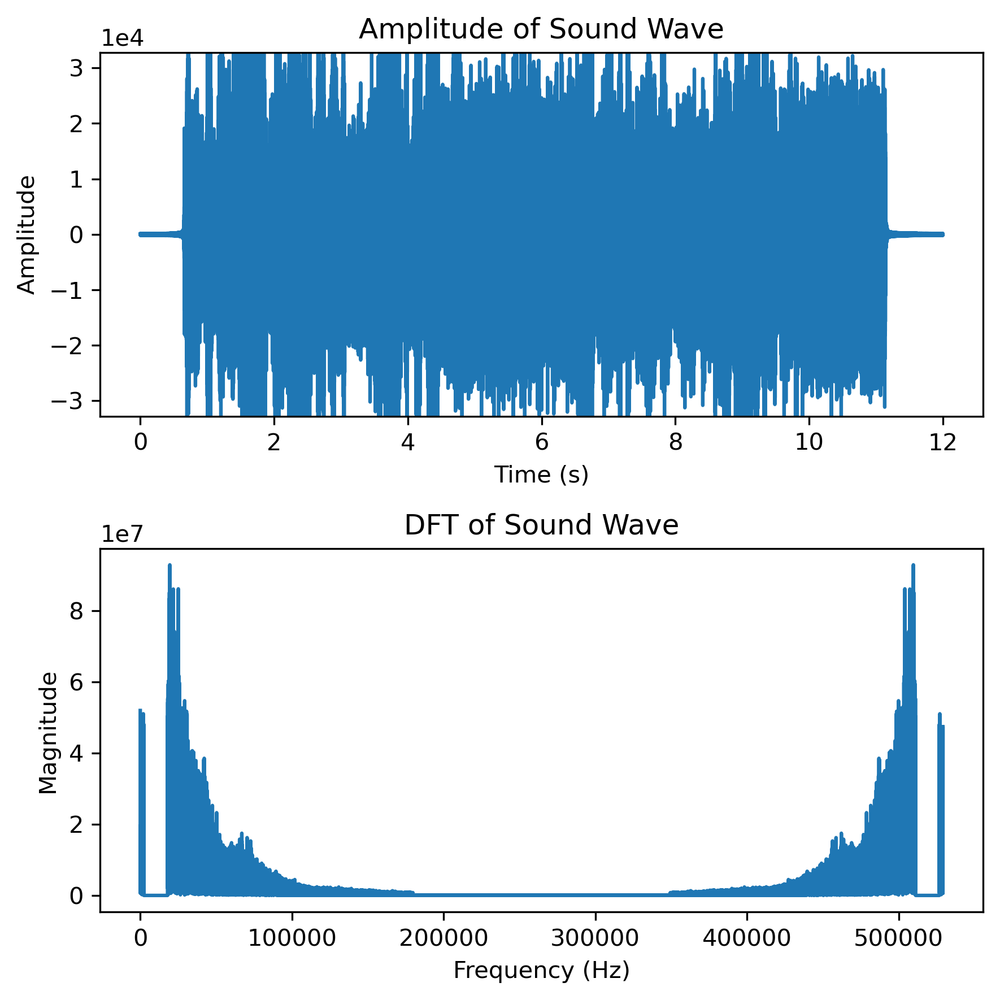

In [8]:
# clean the vuvuzela sound wave of the left and right channels
vuvuzela1.clean(200,500)
vuvuzela2.clean(200,500)

# recombine the left and right channels into a nx2 array
cleanstereo = np.array([vuvuzela1.samples, vuvuzela2.samples]).T

# play the cleaned vuvuzela1 sound wave.
ipd.Audio(data = vuvuzela1.samples, rate=vuvuzela1.rate)


In [155]:
# play the cleaned vuvuzela2 sound wave.
ipd.Audio(data = vuvuzela2.samples, rate=vuvuzela2.rate)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

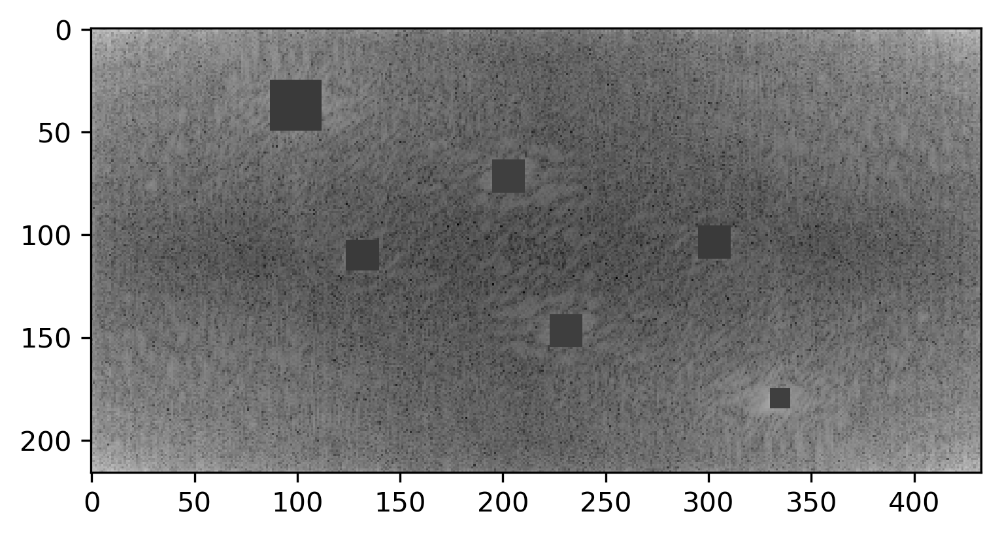

In [156]:
image = imageio.imread("license_plate.png")
im_dft = fftpack.fft2(image)
im_dft[139:155,223:239] = im_dft.mean()
im_dft[64:80,195:211] = im_dft.mean()
im_dft[175:185,330:340] = im_dft.mean()
im_dft[25:50,87:112] = im_dft.mean()
im_dft[103:118,124:140] = im_dft.mean()
im_dft[96:112,295:311] = im_dft.mean()

plt.imshow(np.log(np.abs(im_dft)), cmap="gray")

The year on the sticker is... 13

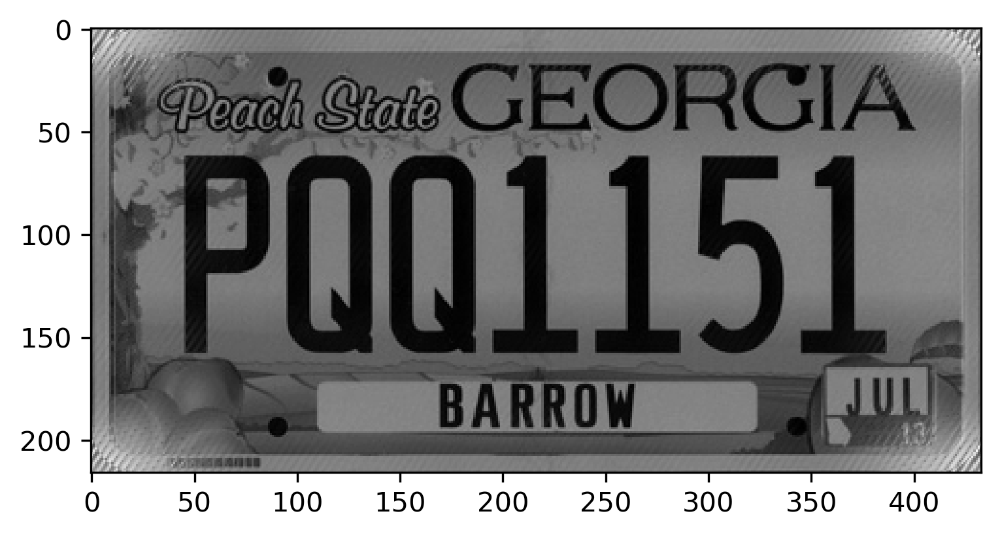

In [157]:
plt.imshow(np.abs(fftpack.ifft2(im_dft)), cmap="gray")
plt.show() 